# Worksheet 07

Name:  Grace Elias
UID: U91459237

### Topics

- Density-Based Clustering

### Density-Based Clustering

Follow along with the live coding of the DBScan algorithm.

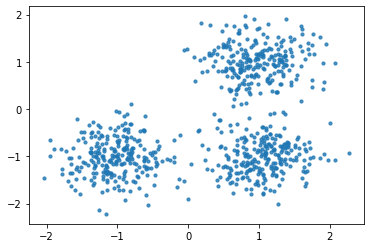

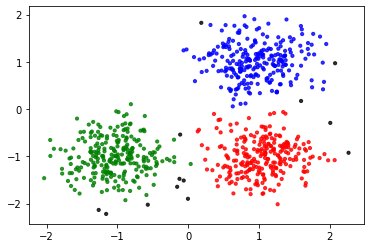

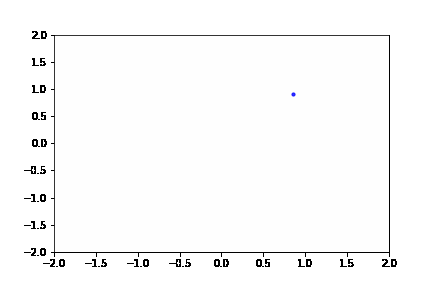

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

centers = [[1, 1], [-1, -1], [1, -1]]
X, _ = datasets.make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)
plt.scatter(X[:,0],X[:,1],s=10, alpha=0.8)
plt.show()

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts
        self.epsilon = epsilon
        self.assignments = [-1 for _ in range(len(self.dataset))]
        self.x_values = []
        self.y_values = []
        self.non_null_assignments = []
        self.index = 0
        self.snaps = []
        
    def distance(self, i, j):
        return np.linalg.norm(self.dataset[i] - self.dataset[j])
    
    def get_neighborhood(self, i):
        neighborhood = []
        for j in range(len(self.dataset)):
            if i != j and self.distance(i,j) <= self.epsilon:
                neighborhood.append(j)
        return neighborhood
    
    def get_unassigned_neighborhood(self, i):
        neighborhood = self.get_neighborhood(i)
        return [point for point in neighborhood if self.assignments[point] == -1]
        
    def is_core(self, i):
        return len(self.get_neighborhood(i)) >= self.min_pts 
    
    def make_cluster(self, i, cluster_num):
        self.assignments[i] = cluster_num
        neighborhood_queue = self.get_unassigned_neighborhood(i) # TODO: make stack or use dequeue
        
        while neighborhood_queue:
            next_pt = neighborhood_queue.pop()
            if(self.assignments[next_pt] != -1): # TODO: make this a function and improve data
                continue
            self.assignments[next_pt] = cluster_num # NOTE: border points will be assigned in FCFS way
            
            self.x_values.append(self.dataset[next_pt][0])
            self.y_values.append(self.dataset[next_pt][1])
            self.non_null_assignments.append(cluster_num)
    
            plt.scatter(self.x_values, self.y_values, color=colors[self.non_null_assignments].tolist(), s=10, alpha=0.8)
            plt.xlim(-2, 2)
            plt.ylim(-2, 2)
            plt.savefig("img1_" + str(self.index) + ".png")
            self.snaps.append(im.open("img1_" + str(self.index) + ".png"))
            self.index += 1
            plt.close()
            
            if self.is_core(next_pt):
                neighborhood_queue += self.get_neighborhood(next_pt)
        return 

    def dbscan(self):
        """
        returns a list of assignments. The index of the
        assignment should match the index of the data point
        in the dataset.
        """
        cluster_num = 0
        for i in range(len(self.dataset)):
            if self.assignments[i] != -1:
                continue
            if self.is_core(i):
                # start building new cluster
                self.make_cluster(i, cluster_num)
                cluster_num += 1
        
        return self.assignments

colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 20)
dbc = DBC(X, 5, .3)
clustering = dbc.dbscan()

plt.scatter(X[:, 0], X[:, 1], color=colors[clustering].tolist(), s=10, alpha=0.8) 
plt.show()

dbc.snaps[0].save(
    'grace_dbscan_1.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)

Image(filename="grace_dbscan_1.gif", width=500, height=500)


## Challenge Problem

Using the code above and the template provided below, create the animation below of the DBScan algorithm.

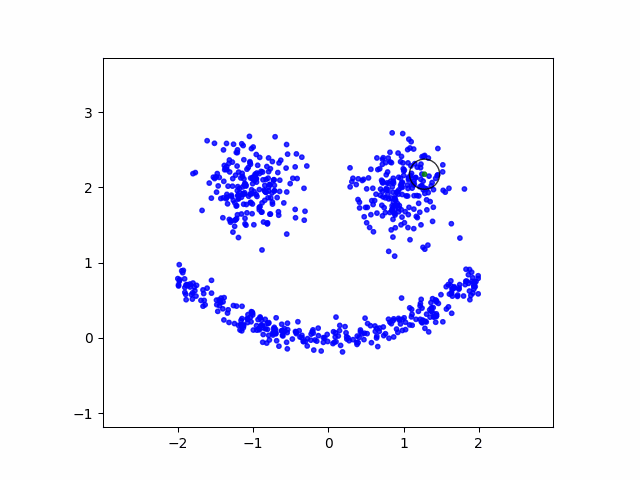

In [36]:
from IPython.display import Image
Image(filename="dbscan_2.gif", width=500, height=500)

Hints:

- First animate the dbscan algorithm for the dataset used in class (before trying to create the above dataset)
- Take a snapshot of the assignments when the point gets assigned to a cluster
- Confirm that the snapshot works by saving it to a file
- Don't forget to close the matplotlib plot after saving the figure
- Gather the snapshots in a list of images that you can then save as a gif using the code below
- Use `ax.set_aspect('equal')` so that the circles don't appear to be oval shaped
- To create the above dataset you need two blobs for the eyes. For the mouth you can use the following process to generate (x, y) pairs:
  - Pick an x at random in an interval that makes sense given where the eyes are positioned
  - For that x generate y that is 0.2 * x^2 plus a small amount of randomness
  - `zip` the x's and y's together and append them to the dataset containing the blobs

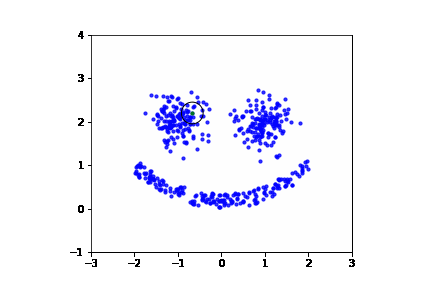

In [41]:
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

TEMPFILE = 'temp.png'

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts
        self.epsilon = epsilon
        self.assignments = [-1 for _ in range(len(self.dataset))]
        self.x_values = []
        self.y_values = []
        self.non_null_assignments = []
        self.index = 0
        self.snaps = []
        
    def distance(self, i, j):
        return np.linalg.norm(self.dataset[i] - self.dataset[j])
    
    def get_neighborhood(self, i):
        neighborhood = []
        for j in range(len(self.dataset)):
            if i != j and self.distance(i,j) <= self.epsilon:
                neighborhood.append(j)
        return neighborhood
    
    def get_unassigned_neighborhood(self, i):
        neighborhood = self.get_neighborhood(i)
        return [point for point in neighborhood if self.assignments[point] == -1]
        
    def is_core(self, i):
        return len(self.get_neighborhood(i)) >= self.min_pts 
    
    def make_cluster(self, i, cluster_num):
        self.assignments[i] = cluster_num
        neighborhood_queue = self.get_unassigned_neighborhood(i) # TODO: make stack or use dequeue
        
        while neighborhood_queue:
            next_pt = neighborhood_queue.pop()
            if(self.assignments[next_pt] != -1): # TODO: make this a function and improve data
                continue
            self.assignments[next_pt] = cluster_num # NOTE: border points will be assigned in FCFS way
            
            self.snaps.append(self.snapshot(cluster_num, next_pt))
            
            if self.is_core(next_pt):
                neighborhood_queue += self.get_neighborhood(next_pt)
        return 

    def snapshot(self, cluster_num, next_pt):
        fig, ax = plt.subplots()
        colors = np.array(['g','r','c'])
        colors = np.hstack([colors] * 20)
        
        self.x_values.append(self.dataset[next_pt][0])
        self.y_values.append(self.dataset[next_pt][1])
        self.non_null_assignments.append(cluster_num)
        
        ax.scatter(self.dataset[:, 0], self.dataset[:, 1], color = 'b', s=10, alpha=.8)
        ax.scatter(self.x_values, self.y_values, color=colors[self.non_null_assignments].tolist(), s=10, alpha=0.8)
        cir = plt.Circle((self.dataset[next_pt][0], self.dataset[next_pt][1]), radius = .25, edgecolor='k', facecolor = 'none') # create circle around the point assigned
        ax.add_patch(cir)
        ax.set_xlim(-3, 3)
        ax.set_ylim(-1, 4)
        ax.set_aspect('equal') # necessary or else the circles appear to be oval shaped

        fig.savefig("img2_" + str(self.index) + ".png")
        self.index += 1
        plt.close()

        return im.fromarray(np.asarray(im.open("img2_" + str(self.index - 1) + ".png")))


    def dbscan(self):
        """
        returns a list of assignments. The index of the
        assignment should match the index of the data point
        in the dataset.
        """
        cluster_num = 0
        for i in range(len(self.dataset)):
            if self.assignments[i] != -1:
                continue
            if self.is_core(i):
                # start building new cluster
                self.make_cluster(i, cluster_num)
                cluster_num += 1
        
        return self.assignments


centers = [[-1,2], [1, 2]]
eyes, _ = datasets.make_blobs(n_samples=300, centers=centers, cluster_std=0.3,
                            random_state=0)
mouth = []
for i in range(200):
    mouth_x = 4 * np.random.random() - 2
    mouth_y = .2*mouth_x**2 + .35 * np.random.random()
    mouth.append([mouth_x, mouth_y])
    

face = np.append(eyes, np.array(mouth), axis=0)

dbc = DBC(face, 5, .3)
clustering = dbc.dbscan()

dbc.snaps[0].save(
    'grace_dbscan_2.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)

Image(filename="grace_dbscan_2.gif", width=500, height=500)